In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.losses import MeanSquaredError
import pathlib
import pandas as pd
import umap
import os
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, silhouette_score, calinski_harabasz_score
from sklearn.cluster import KMeans
from scipy.optimize import linear_sum_assignment as linear_assignment
import pickle
from PIL import Image, ImageDraw, ImageFont

In [6]:
# Function to calculate clustering accuracy
def accuracy(y_true, y_pred):
    y_true = y_true.astype(np.int64)
    assert y_pred.size == y_true.size
    D = max(y_pred.max(), y_true.max()) + 1
    w = np.zeros((D, D), dtype=np.int64)
    
    for i in range(y_pred.size):
        w[y_pred[i], y_true[i]] += 1
    row_ind, col_ind = linear_assignment(w.max() - w)
    
    return w[row_ind, col_ind].sum() * 1.0 / y_pred.size

In [7]:
# Load data
data_dir = pathlib.Path('../Data_set')  # relative path to the data set
batch_size = 32
img_height = 224
img_width = 224

ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    shuffle=True,
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size,  
    label_mode='int')

class_names = ds.class_names
print(class_names)

Found 5017 files belonging to 2 classes.
['Abstract_Expressionism', 'Cubism']


2024-06-25 17:40:30.553971: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


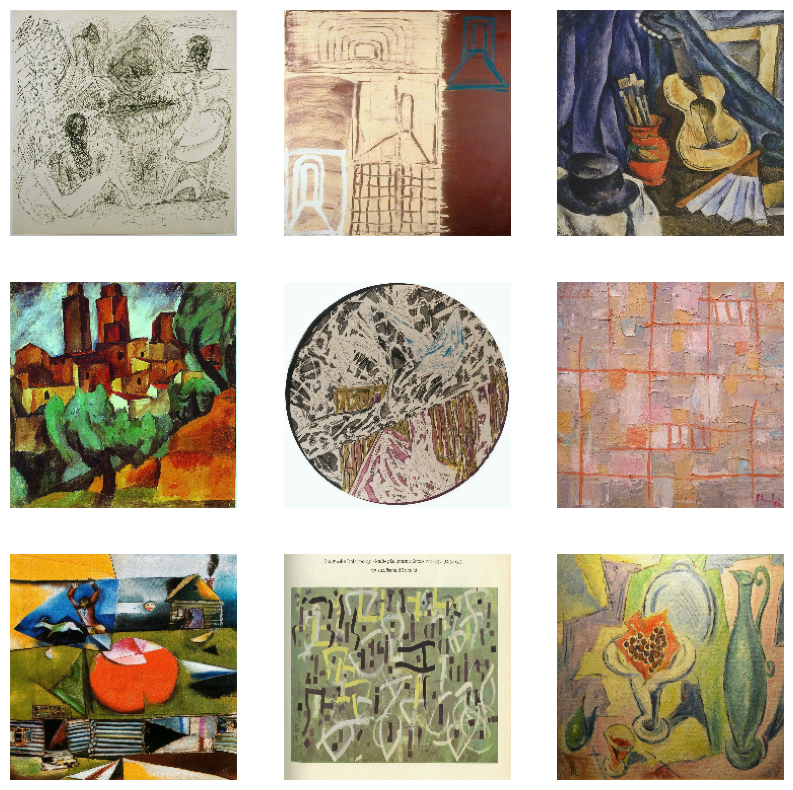

In [8]:
# Display a few images
plt.figure(figsize=(10, 10))
for images, labels in ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.axis("off")
plt.show()

In [9]:
# Extract features using a pre-trained model
preprocess_input = tf.keras.applications.densenet.preprocess_input

base_model = tf.keras.applications.DenseNet121(input_shape=(224, 224, 3),
                                               include_top=False,
                                               weights=None,  # Set to None to load weights manually
                                               pooling='avg')

# Load weights manually
weights_path = '../Model/densenet121_weights_tf_dim_ordering_tf_kernels_notop.h5'
base_model.load_weights(weights_path)

base_model.trainable = False

inputs = tf.keras.Input(shape=(224, 224, 3))
x = preprocess_input(inputs)
outputs = base_model(x, training=False)
model = tf.keras.Model(inputs, outputs)

In [10]:
features = []
labels = np.array([])
for x, y in ds:
    features.append(model.predict(x))
    labels = np.concatenate([labels, y])

features = np.vstack(features)

# Save the features variable as a numpy array file in the Model folder
np.save(os.path.join('../Model', 'features.npy'), features)

1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━

2024-06-25 18:02:55.883343: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [62]:
# Load the features variable from the file saved in the Model folder
features = np.load('../Model/features.npy')

In [102]:
# Define and pre-train a simple fully-connected autoencoder
"""
def autoencoder(dims, act='relu', init='glorot_uniform'):
    # input
    input_img = tf.keras.layers.Input(shape=(dims[0],), name='input')
    x = input_img
    # internal layers of the encoder
    for dim in dims[1:-1]:
        x = tf.keras.layers.Dense(dim, activation=act, kernel_initializer=init)(x)
    
    # bottleneck
    encoded = tf.keras.layers.Dense(dims[-1], kernel_initializer=init, name='encoded')(x)
    x = encoded
    
    # hidden layers of the decoder
    for i in range(n_stacks-1, 0, -1):
        x = tf.keras.layers.Dense(dims[i], activation=act, kernel_initializer=init)(x)

    # output
    for dim in dims[-2:0:-1]:  # nötig???
        x = tf.keras.layers.Dense(dim, activation=act, kernel_initializer=init)(x)
    decoded = tf.keras.layers.Dense(dims[0], kernel_initializer=init)(x)
    return tf.keras.models.Model(input_img, decoded), tf.keras.models.Model(input_img, encoded)
"""
# original one:
def autoencoder(dims, act='relu', init='glorot_uniform'):
    n_stacks = len(dims) - 1
    # input
    input_img = tf.keras.layers.Input(shape=(dims[0],), name='input')
    x = input_img
    # internal layers of the encoder
    for i in range(n_stacks-1):
        x = tf.keras.layers.Dense(dims[i + 1], activation=act, kernel_initializer=init, name='encoder_%d' % i)(x)

    # bottleneck
    encoded = tf.keras.layers.Dense(dims[-1], kernel_initializer=init, name='encoder_%d' % (n_stacks - 1))(x)  # hidden layer, features are extracted from here

    x = encoded
    # hidden layers of the decoder
    for i in range(n_stacks-1, 0, -1):
        x = tf.keras.layers.Dense(dims[i], activation=act, kernel_initializer=init, name='decoder_%d' % i)(x)

    # output
    x = tf.keras.layers.Dense(dims[0], kernel_initializer=init, name='decoder_0')(x)
    decoded = x
    return tf.keras.models.Model(inputs=input_img, outputs=decoded, name='AE'), tf.keras.models.Model(inputs=input_img, outputs=encoded, name='encoder')


In [103]:
dims = [1024,  # input dimension
        500, 500, 2000,  # hidden layers
        10]  # output dimension

autoencoder, encoder = autoencoder(dims)
autoencoder.compile(optimizer='adam', loss='mse')
autoencoder.fit(features, features, batch_size=256, epochs=200)

# Save the autoencoder model
save_dir = '../Model'
autoencoder.save(save_dir + '/pretrained_autoencoder.h5')

Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 186ms/step - loss: 0.6573
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 4s 187ms/step - loss: 0.3893
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.3785
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.3782
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.3769
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 171ms/step - loss: 0.3767
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.3774
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step - loss: 0.3616
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 117ms/step - loss: 0.3407
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.3217
Epoch 11/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.3141
Epoch 12/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - loss: 0.3088
Epoch 13/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.3020
Epoch 14/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.2943
Epoch 15/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s

In [105]:
# load and complie the autoencoder model from the file saved in the Model folder
autoencoder = tf.keras.models.load_model('../Model/pretrained_autoencoder.h5', custom_objects={'mse': MeanSquaredError()})
autoencoder.compile(optimizer='adam', loss='mse')
encoder = tf.keras.models.Model(inputs=autoencoder.input, outputs=autoencoder.get_layer('encoder_%d' % (len(dims) - 2)).output)

In [106]:
# Define the deep clustering layer
class ClusteringLayer(tf.keras.layers.Layer):
    def __init__(self, n_clusters, **kwargs):
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters

    def build(self, input_shape):
        assert len(input_shape) == 2
        input_dim = input_shape[1]
        self.clusters = self.add_weight(shape=(self.n_clusters, input_dim),
                                        initializer='glorot_uniform',
                                        trainable=True)

    def call(self, inputs):
        q = 1.0 / (1.0 + (tf.reduce_sum(tf.square(tf.expand_dims(inputs, axis=1) - self.clusters), axis=2) / 1.0))
        # q **= 1.5
        q = q / tf.reduce_sum(q, axis=1, keepdims=True)
        return q

In [107]:
n_clusters = 10
clustering_layer = ClusteringLayer(n_clusters, name='clustering')(encoder.output)
model = tf.keras.models.Model(inputs=encoder.input, outputs=clustering_layer)
model.compile(optimizer='adam', loss='kld')

In [108]:
# Initialize cluster centroids using k-means
kmeans = KMeans(n_clusters=n_clusters, n_init=20)
y_pred = kmeans.fit_predict(encoder.predict(features))
model.get_layer(name='clustering').set_weights([kmeans.cluster_centers_])

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step


In [109]:
# Compute auxiliary target distribution
def target_distribution(q):
    weight = q ** 2 / q.sum(0)
    return (weight.T / weight.sum(1)).T

In [110]:
# Train the model
batch_size = 128
maxiter = 8000
update_interval = 140
tol = 0.001
index_array = np.arange(features.shape[0])
y_pred_last = np.copy(y_pred)

for ite in range(int(maxiter)):
    if ite % update_interval == 0:
        q = model.predict(features, verbose=0)
        p = target_distribution(q)
        embedded_features = encoder.predict(features)
        y_pred = q.argmax(1)
        if labels is not None:
            # acc = accuracy(labels, y_pred)
            nmi = normalized_mutual_info_score(labels, y_pred)
            ars = adjusted_rand_score(labels, y_pred)
            ss = silhouette_score(embedded_features, y_pred)
            chs = calinski_harabasz_score(embedded_features, y_pred)
            # print(f'Iter {ite}: acc = {acc:.5f}, nmi = {nmi:.5f}, ars = {ars:.5f}, ss = {ss:.5f}, chs = {chs:.5f}')

        delta_label = np.sum(y_pred != y_pred_last).astype(np.float32) / y_pred.shape[0]
        y_pred_last = np.copy(y_pred)
        if ite > 0 and delta_label < tol:
            print(f'delta_label {delta_label} < tol {tol}')
            print('Reached tolerance threshold. Stopping training.')
            break

    idx = index_array[ite * batch_size: min((ite + 1) * batch_size, features.shape[0])]
    model.train_on_batch(x=features[idx], y=p[idx])

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step
delta_label 0.0 < tol 0.001
Reached tolerance threshold. Stopping training.


In [111]:
# Save the model
model.save('../Model/deep_clustering_model.keras')

In [126]:
# Load and compile the model
model = tf.keras.models.load_model('../Model/deep_clustering_model.keras', custom_objects={'ClusteringLayer': ClusteringLayer})
model.compile(optimizer='adam', loss='kld')

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step


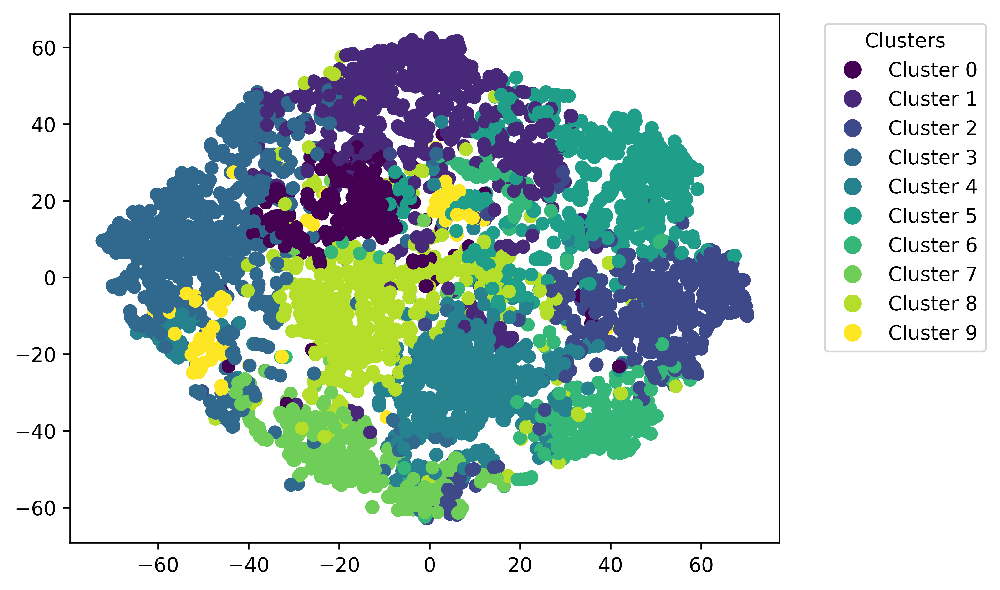

In [127]:
# Visualization with t-SNE
embedded_features = encoder.predict(features)
tsne = TSNE(n_components=2, random_state=42)
tsne_embedding = tsne.fit_transform(embedded_features)

# Create a scatter plot with the viridis colormap
plt.figure(dpi=600)
scatter = plt.scatter(tsne_embedding[:, 0], tsne_embedding[:, 1], c=y_pred, cmap='viridis')

# Create legend handles manually
num_clusters = len(np.unique(y_pred))
cmap = plt.get_cmap('viridis', num_clusters)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=cmap(i), markersize=10, label=f'Cluster {i}') for i in range(num_clusters)]

# Add legend to the plot
plt.legend(handles=handles, title='Clusters', bbox_to_anchor=(1.05, 1), loc='upper left')

# save the plot
image_path = '../Results/cluster_visualization/'
image_name = 't-SNE_k=' + str(n_clusters)
plt.savefig(image_path + image_name + '.png', bbox_inches='tight', pad_inches=0.1)
plt.show()

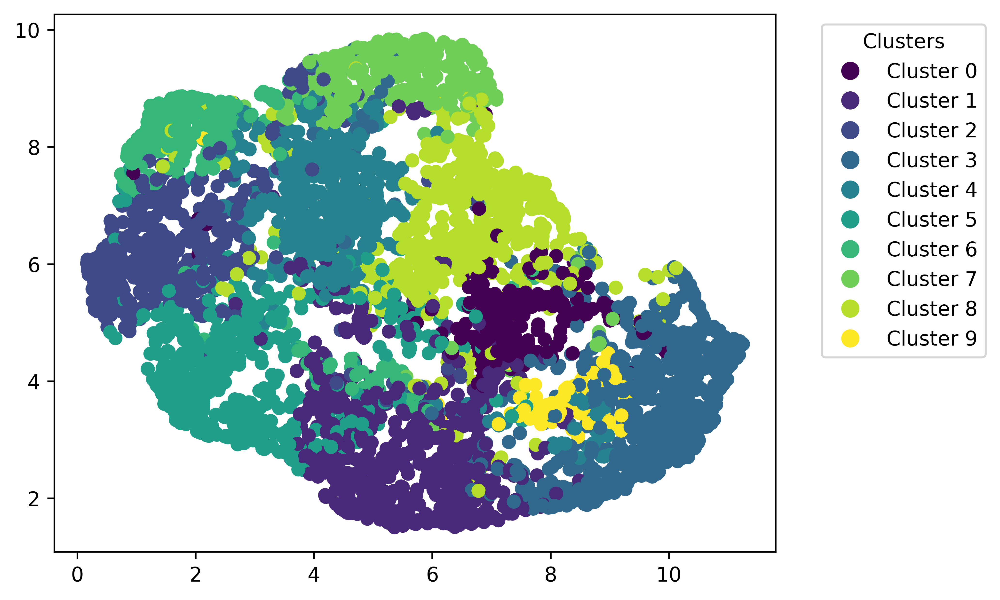

In [114]:
# Visualization with 
reducer = umap.UMAP()
umap_embedding = reducer.fit_transform(embedded_features)

# Create a scatter plot with the viridis colormap
plt.figure(dpi=600)
scatter = plt.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=y_pred, cmap='viridis')

# Create legend handles manually
num_clusters = len(np.unique(y_pred))
cmap = plt.get_cmap('viridis', num_clusters)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=cmap(i), markersize=10, label=f'Cluster {i}') for i in range(num_clusters)]

# Add legend to the plot
plt.legend(handles=handles, title='Clusters', bbox_to_anchor=(1.05, 1), loc='upper left')

# save the plot
image_path = '../Results/cluster_visualization/'
image_name = 'UMAP_k=' + str(n_clusters)
plt.savefig(image_path + image_name + '.png', bbox_inches='tight', pad_inches=0.1)

plt.show()

In [115]:
# Collect file paths and labels
file_paths = []
labels = []

class_names = sorted(os.listdir(data_dir))

# Filter out non-directory entries from class_names
class_names = [name for name in class_names if os.path.isdir(os.path.join(data_dir, name))]
class_indices = {name: index for index, name in enumerate(class_names)}

# add all file paths and labels to the lists
for class_name in class_names:
    class_dir = os.path.join(data_dir, class_name)
    for file_name in os.listdir(class_dir):
        file_path = os.path.join(class_dir, file_name)
        # Ensure the file is not a directory
        if not os.path.isdir(file_path):
            file_paths.append(file_path)
            labels.append(class_indices[class_name])

# Create a DataFrame
file_paths_df = pd.DataFrame({
    'file_path': file_paths,
    'label': labels
})

In [116]:
def load_and_preprocess_image(path):
    img = image.load_img(path, target_size=(img_height, img_width))
    img = image.img_to_array(img)
    img = preprocess_input(img)
    return img

# Convert to TensorFlow dataset
file_paths_ds = tf.data.Dataset.from_tensor_slices(file_paths_df['file_path'])
image_ds = file_paths_ds.map(lambda path: tf.py_function(load_and_preprocess_image, [path], tf.float32))

# Pair images with labels
label_ds = tf.data.Dataset.from_tensor_slices(tf.cast(file_paths_df['label'], tf.int64))
ds = tf.data.Dataset.zip((image_ds, label_ds))

# Batch the dataset
ds = ds.batch(batch_size)

In [117]:
# Create DataFrame for predictions
y_pred_df = pd.DataFrame(y_pred, columns=['y_pred'])
df = pd.concat([file_paths_df['file_path'], y_pred_df], axis=1)

In [118]:
# Display images

def display_images(cluster_index, number_of_example_images):
    sample = df[df['y_pred'] == cluster_index].sample(n=number_of_example_images,
                                                  random_state=42)
    for index, row in sample.iterrows():
        img = mpimg.imread(row['file_path'])
        plt.imshow(img)
        plt.axis("off")
        plt.show()
        file_name = os.path.basename(row['file_path'])
        folder_name = os.path.basename(os.path.dirname(row['file_path']))
        print(file_name, "of genre:", folder_name)  # print image name and its genre

In [119]:
# plot 3 x 3 pictures for every cluster to visualize the clustering

def plot_images_from_cluster(cluster_index, number_of_example_images=9):
    sample = df[df['y_pred'] == cluster_index].sample(
                                    n=number_of_example_images,
                                    random_state=42)  # fix random state for reproducibility
    # Create a figure for the 3x3 grid
    plt.figure(figsize=(10, 10))
    image_path = '../Results/cluster_example_images/'
    for i, (index, row) in enumerate(sample.iterrows()):
        img = mpimg.imread(row['file_path'])
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(img)
        plt.axis("off")
        file_name = os.path.basename(row['file_path'])
        folder_name = os.path.basename(os.path.dirname(row['file_path']))
        ax.set_title(f"{file_name}\n{folder_name}", fontsize=8)
    
    # Save the plot as a PNG file
    image_name = 'Example_pictures_k=' + str(n_clusters) + '_cluster_nr_' + str(cluster_index)
    plt.savefig(image_path + image_name + '.png')

Cluster index 0


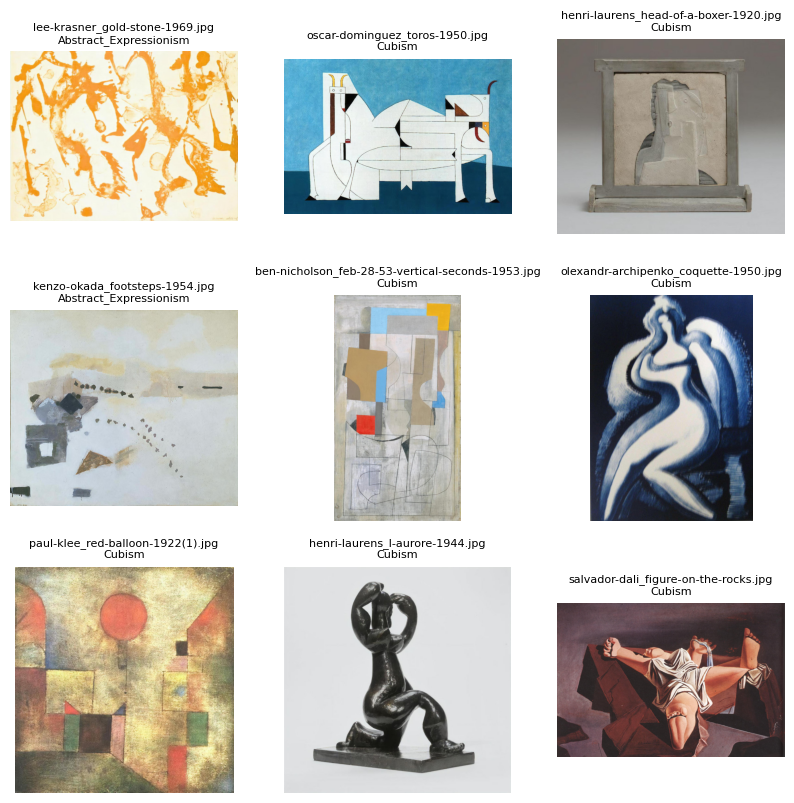

Cluster index 1


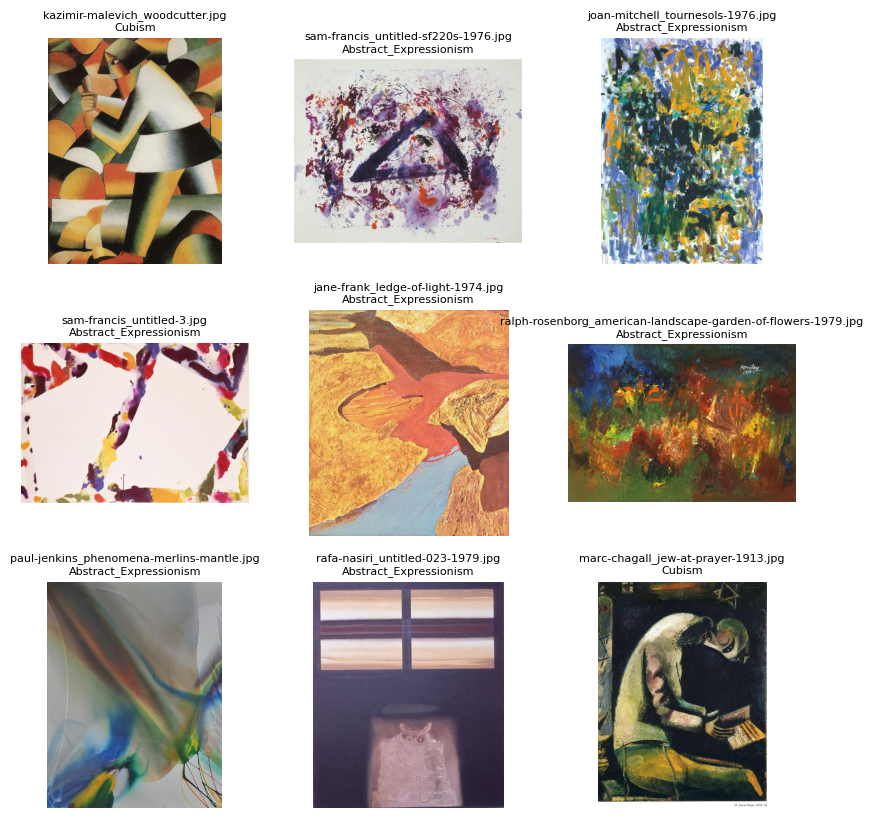

Cluster index 2


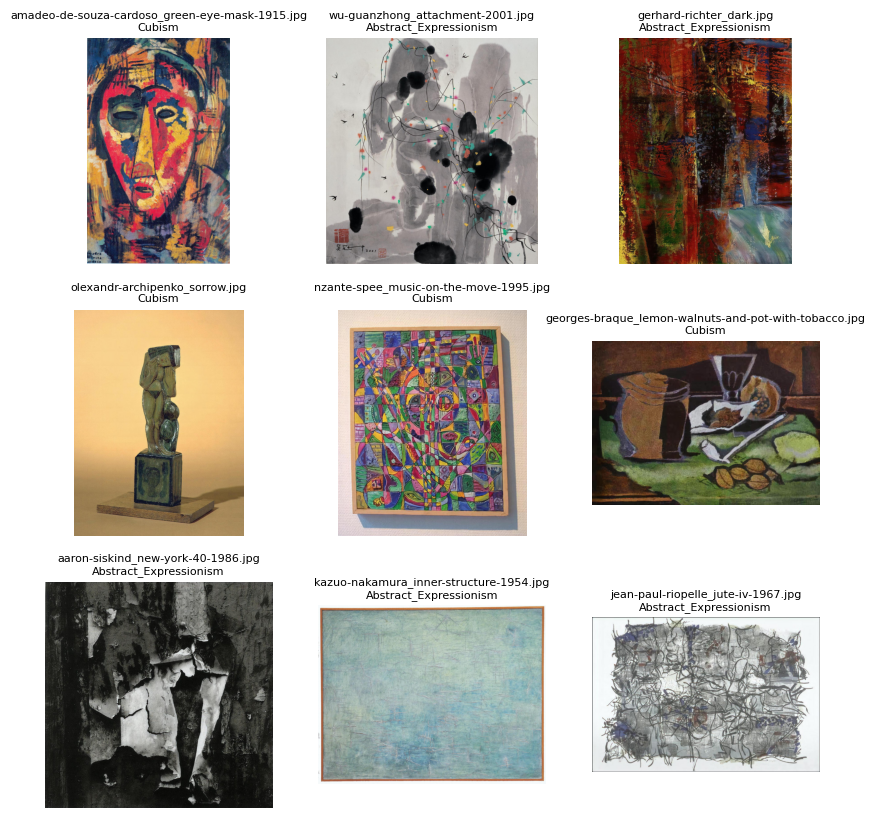

Cluster index 3


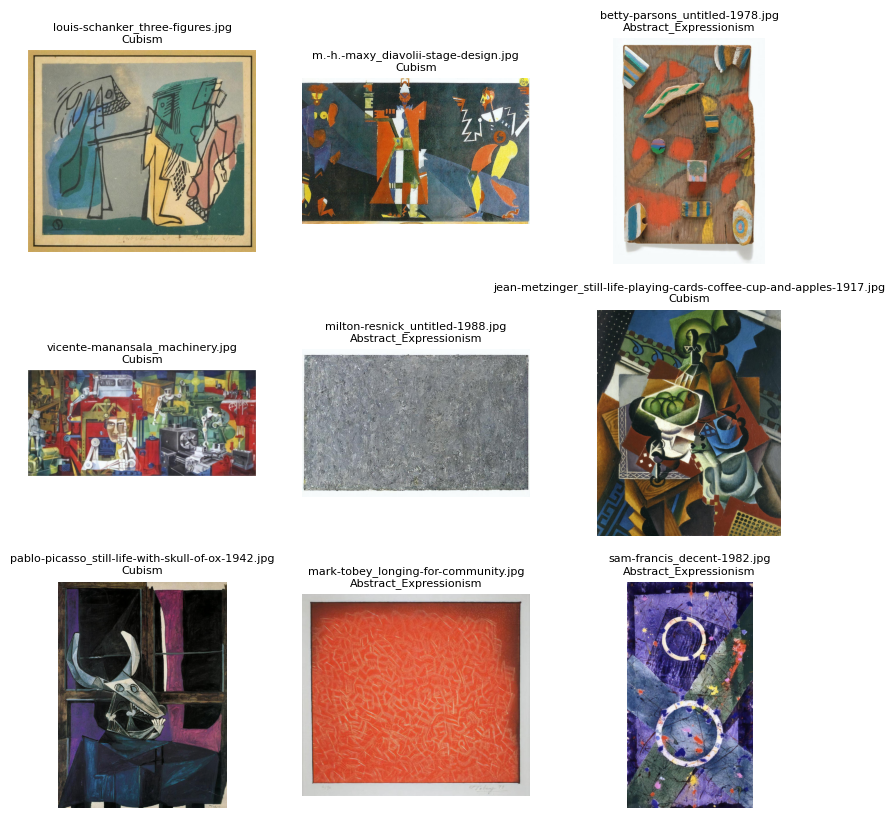

Cluster index 4


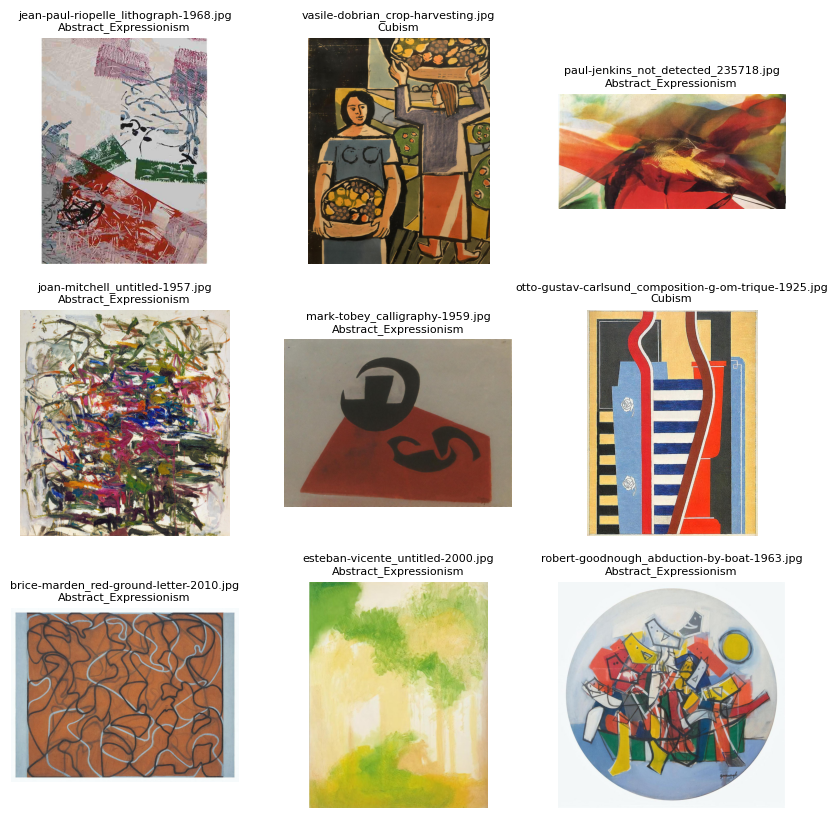

Cluster index 5


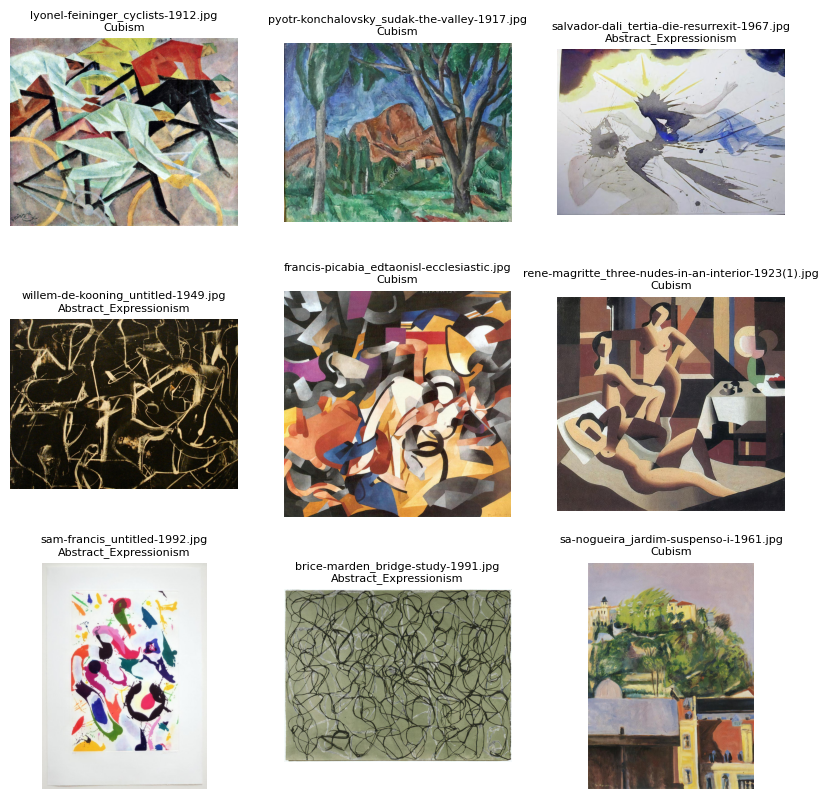

Cluster index 6


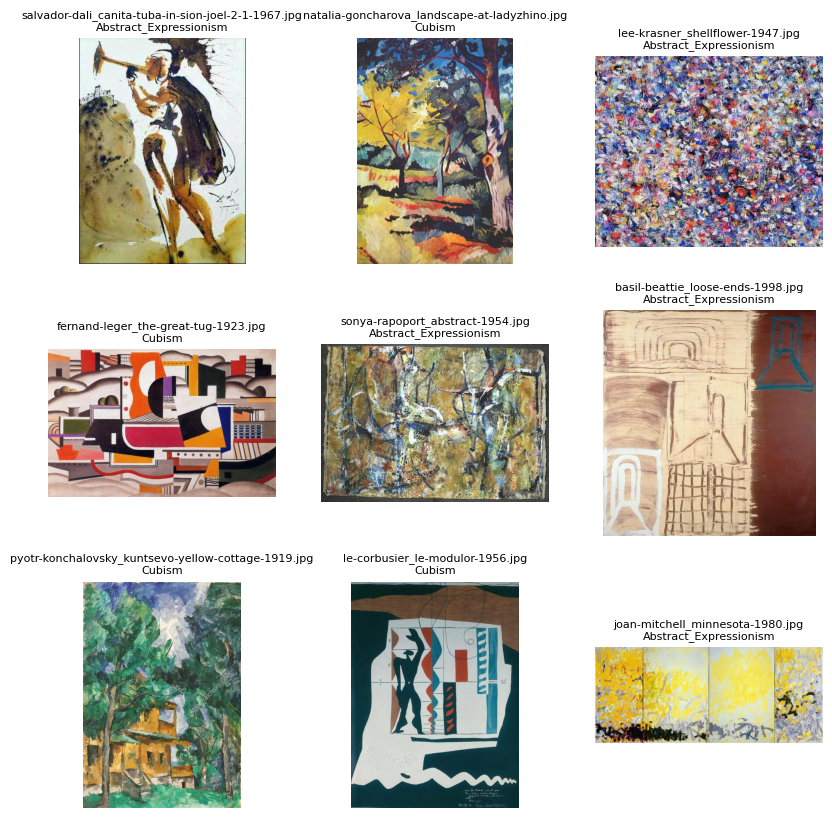

Cluster index 7


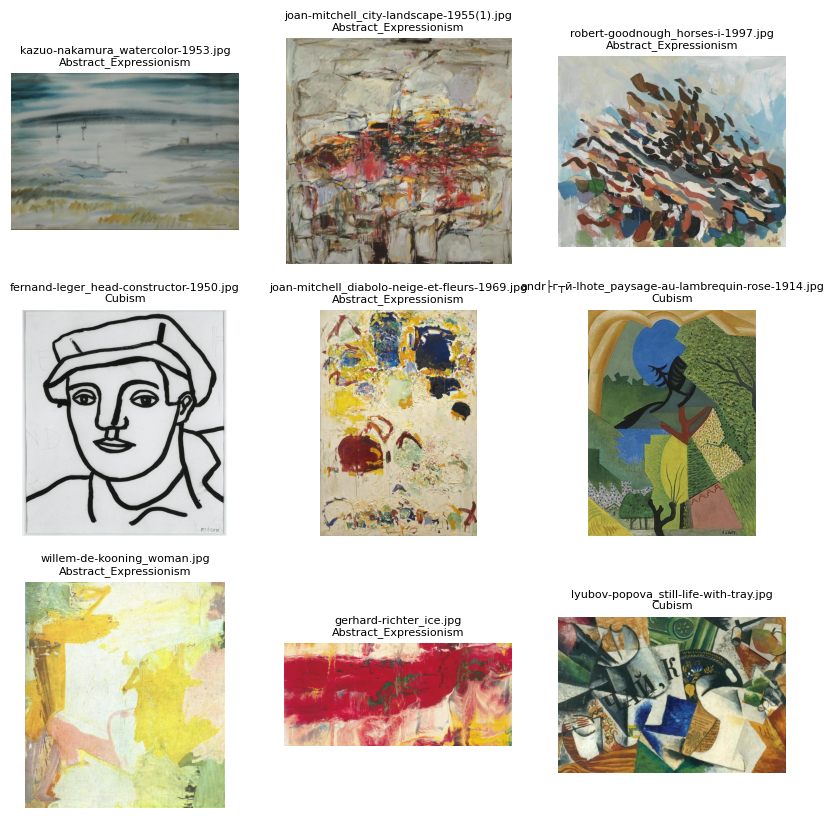

Cluster index 8


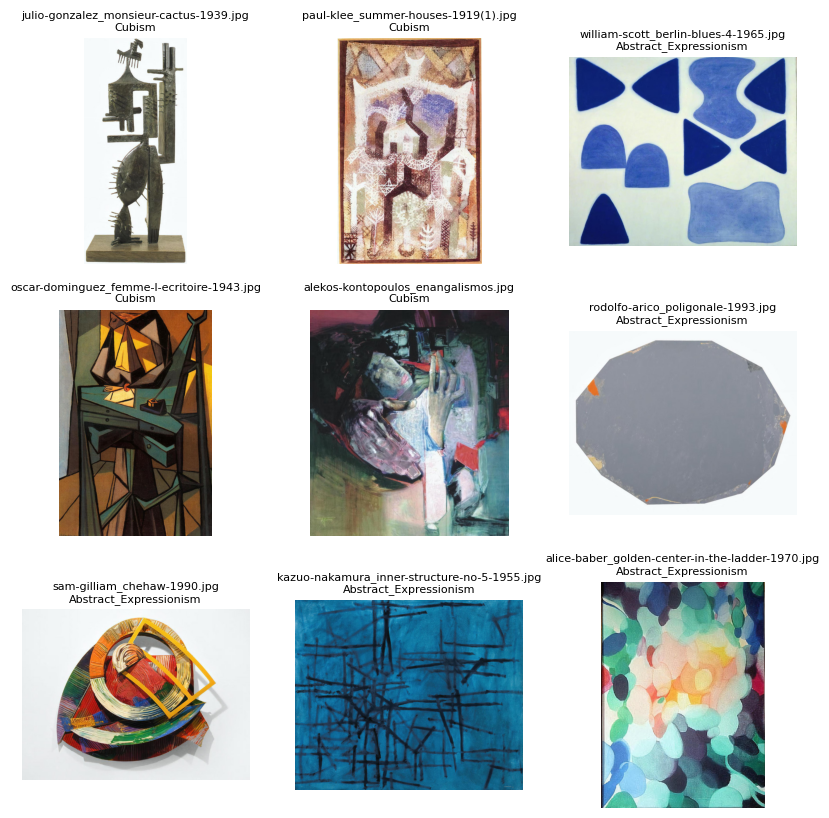

Cluster index 9


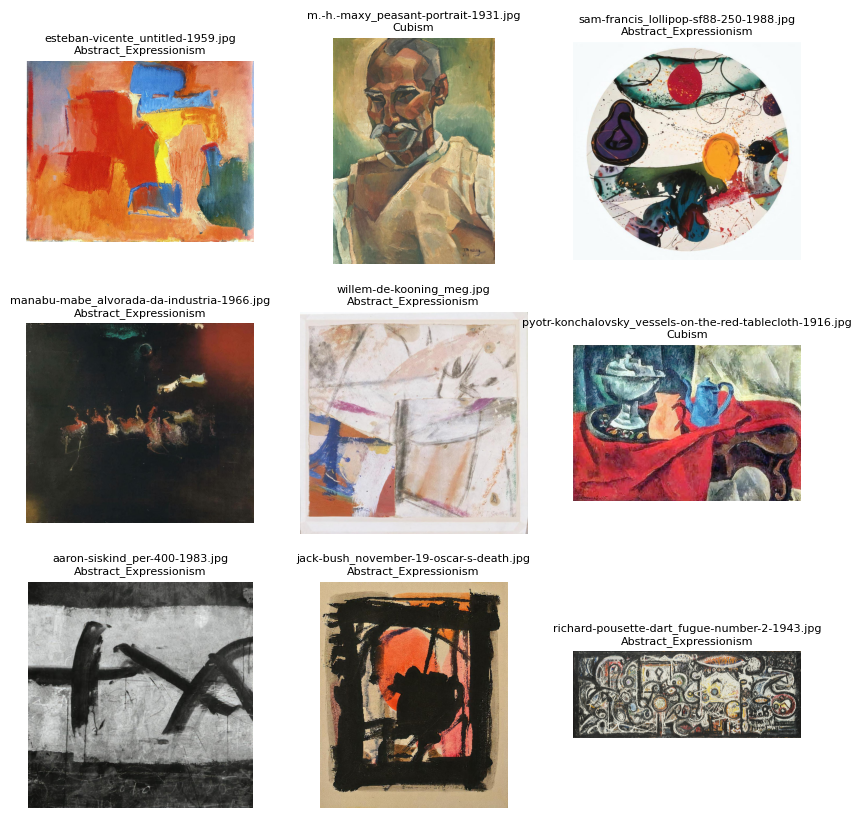

In [120]:
for cluster_index in range(n_clusters):
    print("Cluster index", cluster_index)
    plot_images_from_cluster(cluster_index)
    plt.show()